## 6.2 プラットフォーム全体で観測される報酬を最適化する方策学習

In [1]:
import warnings
warnings.filterwarnings('ignore')

import torch
import numpy as np
import pandas as pd
from pandas import DataFrame
from tqdm import tqdm
from sklearn.utils import check_random_state
import seaborn as sns
import matplotlib.pyplot as plt
import japanize_matplotlib
plt.style.use('ggplot')

from dataset import  generate_waseda_student_data2 ,generate_synthetic_data2
from policylearners import IPSBasedGradientPolicyLearner, CateBasedGradientPolicyLearner_ips,CateBasedGradientPolicyLearner_dr
from utils import softmax

In [ ]:
from policylearners import Keisan

In [ ]:
re = Keisan(1.1,3.3)

print(re.add())
print(re.mainasu())

4.4
-2.1999999999999997


### ログデータ(トレーニングデータ)のサイズ$n$を変化させたときの方策性能の変化

In [ ]:
## シミュレーション設定
num_runs = 50 # シミュレーションの繰り返し回数
dim_x = 5 # 特徴量xの次元
num_actions = 10 # 行動数, |A|
beta = -0.1 # データ収集方策のパラメータ
max_iter = 21 # エポック数
test_data_size = 50000 # テストデータのサイズ
random_state = 12345
torch.manual_seed(random_state)
random_ = check_random_state(random_state)
num_actions_list = [2, 10] # 行動数
num_data_list = [100, 500, 1000, 2000] # トレーニングデータのサイズ

In [ ]:
result_df_data_list = []
for num_actions in num_actions_list:
    ## 期待報酬関数を定義するためのパラメータを抽出
    theta_1 = random_.normal(size=(dim_x, num_actions))
    M_1 = random_.normal(size=(dim_x, num_actions))
    b_1 = random_.normal(size=(1, num_actions))
    theta_0 = random_.normal(size=(dim_x, num_actions))
    M_0 = random_.normal(size=(dim_x, num_actions))
    b_0 = random_.normal(size=(1, num_actions))
    ## 学習された方策の真の性能を近似するためのテストデータを生成
    test_data = generate_synthetic_data2(
        num_data=test_data_size, beta=beta,
        theta_1=theta_1, M_1=M_1, b_1=b_1, theta_0=theta_0, M_0=M_0, b_0=b_0,
        dim_context=dim_x, num_actions=num_actions, random_state = random_state
    )
    pi_0, q_x_a_1, q_x_a_0 = test_data["pi_0"], test_data["q_x_a_1"], test_data["q_x_a_0"]
    pi_0_value = (pi_0 * q_x_a_1 + (1. - pi_0) * q_x_a_0).sum(1).mean()

    result_df_list = []
    for num_data in num_data_list:
        test_policy_value_list = []
        for _ in tqdm(range(num_runs), desc=f"num_data={num_data}..."):
            ## データ収集方策が形成する分布に従いログデータを生成
            offline_logged_data = generate_synthetic_data2(
                num_data=num_data, beta=beta,
                theta_1=theta_1, M_1=M_1, b_1=b_1, theta_0=theta_0, M_0=M_0, b_0=b_0,
                dim_context=dim_x, num_actions=num_actions, random_state = _
            )

            true_value_of_learned_policies = dict()
            true_value_of_learned_policies["logging"] = pi_0_value

            ## ログデータを用いてオフ方策学習を実行する
            ### 勾配ベースのアプローチ (IPS推定量で方策勾配を推定)
            ips = IPSBasedGradientPolicyLearner(
                dim_x=dim_x, num_actions=num_actions, max_iter=max_iter, random_state=random_state + _
            )
            ips.fit(offline_logged_data, test_data)
            pi_ips = ips.predict(test_data)
            true_value_of_learned_policies["ips-pg"] = (pi_ips * q_x_a_1 + (1 - pi_ips) * q_x_a_0).sum(1).mean()
            ### 勾配ベースのアプローチ (新たに開発した推定量で方策勾配を推定)
            cate = CateBasedGradientPolicyLearner(
                dim_x=dim_x, num_actions=num_actions, max_iter=max_iter, random_state=random_state + _
            )
            cate.fit(offline_logged_data, test_data)
            pi_cate = cate.predict(test_data)
            true_value_of_learned_policies["cate-pg"] = (pi_cate * q_x_a_1 + (1 - pi_cate) * q_x_a_0).sum(1).mean()

            test_policy_value_list.append(true_value_of_learned_policies)

        ## シミュレーション結果の集計
        result_df = DataFrame(test_policy_value_list).stack().reset_index(1)\
            .rename(columns={"level_1": "method", 0: "value"})
        result_df["num_data"] = num_data
        result_df["pi_0_value"] = pi_0_value
        result_df["rel_value"] = result_df["value"] / pi_0_value
        result_df_list.append(result_df)
    result_df_data_list.append(pd.concat(result_df_list).reset_index(level=0))


## 早稲田大学のログデータを生成

In [8]:
## シミュレーション設定
num_runs = 50 # シミュレーションの繰り返し回数
dim_x = 5 # 特徴量xの次元
#num_actions = 10 # 行動数, |A|
beta = -0.1 # データ収集方策のパラメータ
max_iter = 21 # エポック数
test_data_size = 5000 # テストデータのサイズ
random_state = 12345
torch.manual_seed(random_state)
random_ = check_random_state(random_state)
num_actions_list = [2,10,21] # 行動数
num_data_list = [100,1000,5000,10000,40000] # トレーニングデータのサイズ

In [9]:
result_df_data_list = []
for num_actions in num_actions_list:
    ## 期待報酬関数を定義するためのパラメータを抽出
    theta_1 = random_.normal(size=(dim_x, num_actions))
    M_1 = random_.normal(size=(dim_x, num_actions))
    b_1 = random_.normal(size=(1, num_actions))
    theta_0 = random_.normal(size=(dim_x, num_actions))
    M_0 = random_.normal(size=(dim_x, num_actions))
    b_0 = random_.normal(size=(1, num_actions))
    ## 学習された方策の真の性能を近似するためのテストデータを生成
    test_data = generate_waseda_student_data2(
        num_data=test_data_size, beta=beta,
        theta_1=theta_1, M_1=M_1, b_1=b_1, theta_0=theta_0, M_0=M_0, b_0=b_0,
        dim_context=dim_x, num_actions=num_actions, random_state = random_state
    )
    pi_0, q_x_a_1, q_x_a_0 = test_data["pi_0"], test_data["q_x_a_1"], test_data["q_x_a_0"]
    pi_0_value = (pi_0 * q_x_a_1 + (1. - pi_0) * q_x_a_0).sum(1).mean()

    result_df_list = []
    for num_data in num_data_list:
        test_policy_value_list = []
        for _ in tqdm(range(num_runs), desc=f"num_data={num_data}..."):
            ## データ収集方策が形成する分布に従いログデータを生成
            offline_logged_data = generate_waseda_student_data2(
                num_data=num_data, beta=beta,
                theta_1=theta_1, M_1=M_1, b_1=b_1, theta_0=theta_0, M_0=M_0, b_0=b_0,
                dim_context=dim_x, num_actions=num_actions, random_state = _
            )

            true_value_of_learned_policies = dict()
            true_value_of_learned_policies["logging"] = pi_0_value

            ## ログデータを用いてオフ方策学習を実行する
            ### 勾配ベースのアプローチ (IPS推定量で方策勾配を推定)
            ips = IPSBasedGradientPolicyLearner(
                dim_x=dim_x, num_actions=num_actions, max_iter=max_iter, random_state=random_state + _
            )
            ips.fit(offline_logged_data, test_data)
            pi_ips = ips.predict(test_data)
            true_value_of_learned_policies["ips-pg"] = (pi_ips * q_x_a_1 + (1 - pi_ips) * q_x_a_0).sum(1).mean()
            
            ### 勾配ベースのアプローチ (新たに開発した推定量で方策勾配を推定)
            cate_ips = CateBasedGradientPolicyLearner_ips(
                dim_x=dim_x, num_actions=num_actions, max_iter=max_iter, random_state=random_state + _
            )
            cate_ips.fit(offline_logged_data, test_data)
            pi_cate_ips = cate_ips.predict(test_data)
            true_value_of_learned_policies["cate_ips-pg"] = (pi_cate_ips * q_x_a_1 + (1 - pi_cate_ips) * q_x_a_0).sum(1).mean()
            
            ###勾配ベースのアプローチ(新たに開発したdr推定量で方策勾配を推定)
            
            #期待報酬関数の推定値の定義
            q0_hat = offline_logged_data["q_x_a_0"] + random_.normal(-0.005, scale=0.0025, size=(num_data, num_actions))
            q1_hat = offline_logged_data["q_x_a_1"] + random_.normal(-0.005, scale=0.0025, size=(num_data, num_actions))
            
            cate_dr = CateBasedGradientPolicyLearner_dr(
                dim_x=dim_x, num_actions=num_actions, max_iter=max_iter, random_state=random_state + _
            )
            cate_dr.fit(offline_logged_data, test_data, q1_hat, q0_hat)
            pi_cate_dr = cate_dr.predict(test_data)
            true_value_of_learned_policies["cate_dr_pg"] = (pi_cate_dr * q_x_a_1 + (1-pi_cate_dr) * q_x_a_0).sum(1).mean()
            

            test_policy_value_list.append(true_value_of_learned_policies)

        ## シミュレーション結果の集計
        result_df = DataFrame(test_policy_value_list).stack().reset_index(1)\
            .rename(columns={"level_1": "method", 0: "value"})
        result_df["num_data"] = num_data
        result_df["pi_0_value"] = pi_0_value
        result_df["rel_value"] = result_df["value"] / pi_0_value
        result_df_list.append(result_df)
    result_df_data_list.append(pd.concat(result_df_list).reset_index(level=0))

num_data=40000...: 100%|██████████| 50/50 [4:20:06<00:00, 312.14s/it]  


In [15]:
result_df_data_list

[     index       method     value  num_data  pi_0_value  rel_value
 0        0      logging  1.030169       100    1.030169   1.000000
 1        0       ips-pg  0.942639       100    1.030169   0.915034
 2        0  cate_ips-pg  1.121448       100    1.030169   1.088607
 3        0   cate_dr_pg  1.059868       100    1.030169   1.028830
 4        1      logging  1.030169       100    1.030169   1.000000
 ..     ...          ...       ...       ...         ...        ...
 995     48   cate_dr_pg  1.076590     40000    1.030169   1.045062
 996     49      logging  1.030169     40000    1.030169   1.000000
 997     49       ips-pg  0.954402     40000    1.030169   0.926453
 998     49  cate_ips-pg  1.163770     40000    1.030169   1.129689
 999     49   cate_dr_pg  1.079228     40000    1.030169   1.047623
 
 [1000 rows x 6 columns],
      index       method     value  num_data  pi_0_value  rel_value
 0        0      logging  4.997782       100    4.997782   1.000000
 1        0       ip

## DR

In [19]:
from collections import OrderedDict
from dataclasses import dataclass

import numpy as np
from sklearn.utils import check_random_state
import torch
import torch.nn as nn
import torch.optim as optim

from utils import GradientBasedPolicyDataset,GradientBasedPolicyDataset_dr

In [39]:
@dataclass
class CateBasedGradientPolicyLearner_ips:
    """勾配ベースのアプローチに基づく、プラットフォーム全体の視聴時間を最大化するオフ方策学習."""
    dim_x: int
    num_actions: int
    hidden_layer_size: tuple = (30, 30, 30)
    activation: str = "elu"
    batch_size: int = 16
    learning_rate_init: float = 0.01
    alpha: float = 1e-6
    imit_reg: float = 0.0
    log_eps: float = 1e-10
    solver: str = "adagrad"
    max_iter: int = 30
    random_state: int = 12345

    def __post_init__(self) -> None:
        """Initialize class."""
        layer_list = []
        input_size = self.dim_x
        torch.manual_seed(self.random_state)

        if self.activation == "tanh":
            activation_layer = nn.Tanh
        elif self.activation == "relu":
            activation_layer = nn.ReLU
        elif self.activation == "elu":
            activation_layer = nn.ELU

        for i, h in enumerate(self.hidden_layer_size):
            layer_list.append(("l{}".format(i), nn.Linear(input_size, h)))
            layer_list.append(("a{}".format(i), activation_layer()))
            input_size = h
        layer_list.append(("output", nn.Linear(input_size, self.num_actions)))
        layer_list.append(("softmax", nn.Softmax(dim=1)))

        self.nn_model = nn.Sequential(OrderedDict(layer_list))

        self.random_ = check_random_state(self.random_state)
        self.naive_value = []
        self.cate_value = []

    def fit(self, dataset: dict, dataset_test: dict) -> None:
        x, a, r = dataset["x"], dataset["a"], dataset["r"]
        a_mat, r_mat, pscore_mat = (
            dataset["a_mat"],
            dataset["r_mat"],
            dataset["pscore_mat"],
        )

        if self.solver == "adagrad":
            optimizer = optim.Adagrad(
                self.nn_model.parameters(),
                lr=self.learning_rate_init,
                weight_decay=self.alpha,
            )
        elif self.solver == "adam":
            optimizer = optim.AdamW(
                self.nn_model.parameters(),
                lr=self.learning_rate_init,
                weight_decay=self.alpha,
            )
        else:
            raise NotImplementedError("`solver` must be one of 'adam' or 'adagrad'")

        training_data_loader = self._create_train_data_for_opl(
            x,
            a,
            r,
            pscore_mat,
            a_mat, ######
            r_mat, ########
        )

        # start policy training
        q_x_a_1 = dataset_test["q_x_a_1"]
        q_x_a_0 = dataset_test["q_x_a_0"]
        for _ in range(self.max_iter):
            self.nn_model.train()
            for x_, a_, r_, pscore_mat_, a_mat_, r_mat_ in training_data_loader:
                optimizer.zero_grad()
                pi = self.nn_model(x_)
                loss = -self._estimate_policy_gradient(
                    a=a_,
                    a_mat=a_mat_,
                    r=r_,
                    r_mat=r_mat_,
                    pscore_mat=pscore_mat_,
                    pi=pi,
                ).mean()
                loss.backward()
                optimizer.step()
            pi = self.predict(dataset_test)
            self.naive_value.append((pi * q_x_a_1).sum(1).mean())
            self.cate_value.append((pi * q_x_a_1 + (1.0 - pi) * q_x_a_0).sum(1).mean())

    def _create_train_data_for_opl(
        self,
        x: np.ndarray,
        a: np.ndarray,
        r: np.ndarray,
        pscore: np.ndarray,
        q_hat: np.ndarray,
        pi_0: np.ndarray,
    ) -> tuple:
        dataset = GradientBasedPolicyDataset(
            torch.from_numpy(x).float(),
            torch.from_numpy(a).long(),
            torch.from_numpy(r).float(),
            torch.from_numpy(pscore).float(),
            torch.from_numpy(q_hat).float(),
            torch.from_numpy(pi_0).float(),
        )

        data_loader = torch.utils.data.DataLoader(
            dataset,
            batch_size=self.batch_size,
        )

        return data_loader

    def _estimate_policy_gradient(
        self,
        a: torch.Tensor,
        a_mat: torch.Tensor,
        r: torch.Tensor,
        r_mat: torch.Tensor,
        pscore_mat: torch.Tensor,
        pi: torch.Tensor,
    ) -> torch.Tensor:
        current_pi = pi.detach()
        log_prob1 = torch.log(pi + self.log_eps)
        log_prob2 = torch.log((1.0 - pi) + self.log_eps)
        idx = torch.arange(a.shape[0], dtype=torch.long)
        
        print("1", current_pi[idx, a] * r / pscore_mat[idx, a])

        estimated_policy_grad_arr = (
            current_pi[idx, a] * r / pscore_mat[idx, a]
        ) * log_prob1[idx, a]
        
        
        estimated_policy_grad_arr += (
            (1 - a_mat) * (1.0 - current_pi) * (r_mat / pscore_mat) * log_prob2
        ).sum(1)

        return estimated_policy_grad_arr

    def predict(self, dataset_test: np.ndarray) -> np.ndarray:

        self.nn_model.eval()
        x = torch.from_numpy(dataset_test["x"]).float()
        return self.nn_model(x).detach().numpy()

In [40]:
cate_ips = CateBasedGradientPolicyLearner_ips(
                dim_x=dim_x, num_actions=num_actions, max_iter=max_iter, random_state=random_state + 11
            )
cate_ips.fit(offline_logged_data, test_data)
pi_cate_ips = cate_ips.predict(test_data)

1 tensor([1.0414, 0.0000, 1.0397, 0.0000, 1.1298, 0.0000, 1.0719, 0.0000, 0.0000,
        0.9708, 0.0000, 0.9633, 0.0000, 0.9174, 0.0000, 0.0000])
1 tensor([0.0000, 0.0000, 0.8607, 1.1643, 0.0000, 0.0000, 0.0000, 1.1346, 1.1917,
        1.0437, 0.0000, 1.1448, 0.0000, 0.0000, 0.0000, 0.0000])
1 tensor([1.1221, 1.0537, 0.0000, 1.2394, 0.0000, 0.0000, 0.9713, 0.0000, 0.0000,
        0.0000, 0.0000, 1.1092, 1.0701, 1.1213, 0.0000, 1.0944])
1 tensor([0.0000, 0.0000, 0.0000, 1.1320, 0.0000, 1.0287, 0.0000, 0.0000, 0.8921,
        0.0000, 1.2897, 0.8820, 1.3184, 1.2328, 0.0000, 0.8697])
1 tensor([0.0000, 1.1728, 0.0000, 0.0000, 0.0000, 1.5294, 0.6292, 1.3383, 0.0000,
        0.8716, 0.0000, 0.0000, 0.0000, 0.6306, 1.0170, 0.0000])
1 tensor([0.0000, 0.8655, 0.0000, 0.0000, 1.3302, 0.4532, 0.0000, 0.0000, 0.0000,
        0.8545, 1.0181, 0.0000, 0.0000, 0.0000, 1.0508, 0.8252])
1 tensor([1.6518, 0.0000, 1.0003, 0.0000, 0.0000, 0.0000, 0.6629, 1.0739, 0.0000,
        0.0000, 0.0000, 0.0000, 0.00

In [47]:
@dataclass
class CateBasedGradientPolicyLearner_dr:
    """勾配ベースのアプローチに基づく，履修率を最大化するオフ方策学習"""
    dim_x: int
    num_actions: int
    hidden_layer_size: tuple = (30, 30, 30)
    activation: str = "elu"
    batch_size: int = 16
    learning_rate_init: float = 0.01
    alpha: float = 1e-6
    imit_reg: float = 0.0
    log_eps: float = 1e-10
    solver: str = "adagrad"
    max_iter: int = 30
    random_state: int = 12345
    
    def __post_init__(self) -> None:
        "Initialize class"
        layer_list = []
        input_size = self.dim_x
        torch.manual_seed(self.random_state)
        
        if self.activation == "tanh":
            activation_layer = nn.Tanh
        elif self.activation == "relu":
            activation_layer == nn.ReLU
        elif self.activation == "elu":
            activation_layer  = nn.ELU
            
        for i, h in enumerate(self.hidden_layer_size):
            layer_list.append(("l{}".format(i), nn.Linear(input_size, h)))
            layer_list.append(("a{}".format(i), activation_layer()))
            input_size = h
            
        layer_list.append(("output", nn.Linear(input_size, self.num_actions)))
        layer_list.append(("softmax", nn.Softmax(dim=1)))
               
        self.nn_model = nn.Sequential(OrderedDict(layer_list))
        
        self.random_ = check_random_state(self.random_state)
        self.naive_value = []
        self.cate_value = []
        
        
    def fit(self, dataset:dict, dataset_test:dict,q1_hat, q0_hat ) -> None: #q1,a0を追加
        x, a, r = dataset["x"], dataset["a"], dataset["r"]
        a_mat, r_mat, pscore_mat = dataset["a_mat"], dataset["r_mat"], dataset["pscore_mat"]
        
        print("fitの",pscore_mat)
        
        #pi_0を追加
        pi_0 = dataset["pi_0"]
        
        ## q1,q0の条件文を追加
        if q0_hat is None:
            q0_hat= np.zeros(r.shape[0], self.num_actions)
         
        if q1_hat is None:
            q1_hat= np.zeros(r.shape[0], self.num_actions)   
         
        if self.solver == "adagrad":
            optimizer = optim.Adagrad(
                self.nn_model.parameters(),
                lr=self.learning_rate_init,
                weight_decay=self.alpha,
            )
        elif self.solver == "adam":
            optimizer = optim.AdamW(
                self.nn_model.parameters(),
                lr=self.learning_rate_init,
                weight_decay=self.alpha,
            )
        else:
            raise NotImplementedError("`solver` must be one of 'adam' or 'adagrad'")
        
        training_data_loader = self._create_train_data_for_opl(
             x,
             a,
                r,
                a_mat,
                r_mat,           
                pscore_mat,
                q1_hat,
                q0_hat
            #pi_0,           
        )
        
        q_x_a_1 = dataset_test["q_x_a_1"]
        q_x_a_0 = dataset_test["q_x_a_0"]
        
        for _ in range(self.max_iter):
            self.nn_model.train()
            for x_, a_, r_,  a_mat_, r_mat_, pscore_mat_, q1_hat_, q0_hat_ in training_data_loader:
                optimizer.zero_grad()
                pi = self.nn_model(x_)
                loss = -self._estimate_policy_gradient(
                    a=a_,
                    a_mat=a_mat_,
                    r=r_,
                    r_mat=r_mat_,
                    pscore_mat=pscore_mat_,
                    pi=pi,
                    q1_hat=q1_hat_,
                    q0_hat=q0_hat_,
                ).mean()
                loss.backward()
                optimizer.step()
            pi = self.predict(dataset_test)
            self.naive_value.append((pi * q_x_a_1).sum(1).mean())
            self.cate_value.append((pi * q_x_a_1 + (1.0 - pi) * q_x_a_0).sum(1).mean())
         
    def _create_train_data_for_opl(
        self,
        x: np.ndarray,
        a: np.ndarray,
        r: np.ndarray,
        a_mat:np.ndarray,
        r_mat: np.ndarray,           
        pscore: np.ndarray,
        q1_hat: np.ndarray,
        q0_hat:np.ndarray,
        #pi_0: np.ndarray,
    ) -> tuple:
        dataset = GradientBasedPolicyDataset_dr(
            torch.from_numpy(x).float(),
            torch.from_numpy(a).long(),
            torch.from_numpy(r).float(),
            torch.from_numpy(a_mat).float(),
            torch.from_numpy(r_mat).float(),
            torch.from_numpy(pscore).float(),
            torch.from_numpy(q1_hat).float(),
            torch.from_numpy(q0_hat).float(),
            #torch.from_numpy(pi_0).float(),
        )

        data_loader = torch.utils.data.DataLoader(
            dataset,
            batch_size=self.batch_size,
        )

        return data_loader 
    
    def _estimate_policy_gradient(
        self,
        a: torch.Tensor,
        a_mat: torch.Tensor,
        r: torch.Tensor,
        r_mat: torch.Tensor,
        pscore_mat: torch.Tensor,
        pi: torch.Tensor,
        ##追加##
        q1_hat: torch.Tensor,
        q0_hat: torch.Tensor,
    ) -> torch.Tensor:
        current_pi = pi.detach()
        log_prob1 = torch.log(pi + self.log_eps)
        log_prob2 = torch.log((1.0 - pi) + self.log_eps)
        idx = torch.arange(a.shape[0], dtype=torch.long)
        
        
        
        print("current_pi", current_pi[idx,a])
        print("r",r)
        print("pscore", pscore_mat[idx, a])
        
        #print("r - q1_hat[idx, a]", r - q1_hat[idx, a])
        print( "計算1ips",current_pi[idx, a] * r / pscore_mat[idx, a])
        print( "計算１dr",current_pi[idx, a] * (r - q1_hat[idx, a]) / pscore_mat[idx, a])
        
        print("計算2",(1 - a_mat) * (1.0 - current_pi) * ((r_mat - q0_hat) / pscore_mat) * log_prob2)
        
        print("計算3",current_pi* (q1_hat + q0_hat) )
        
        

        estimated_policy_grad_arr = (
            current_pi[idx, a] * (r  / pscore_mat[idx, a])
        ) * log_prob1[idx, a]
        
        print("1",estimated_policy_grad_arr)
        
        estimated_policy_grad_arr += (
            (1 - a_mat) * (1.0 - current_pi) * ((r_mat - q0_hat +self.log_eps) / pscore_mat) * log_prob2
        ).sum(1)
        
        print("2",estimated_policy_grad_arr)
        
        estimated_policy_grad_arr += (current_pi* (q1_hat + q0_hat)).sum(1)
        
        print("3",estimated_policy_grad_arr)

        return estimated_policy_grad_arr
    
    def predict(self, dataset_test: np.ndarray) -> np.ndarray:

        self.nn_model.eval()
        x = torch.from_numpy(dataset_test["x"]).float()
        return self.nn_model(x).detach().numpy()           
  

In [12]:
## シミュレーション設定
num_runs = 50 # シミュレーションの繰り返し回数
dim_x = 5 # 特徴量xの次元
#num_actions = 10 # 行動数, |A|
beta = -0.1 # データ収集方策のパラメータ
max_iter = 21 # エポック数
test_data_size = 5000 # テストデータのサイズ
random_state = 12345
torch.manual_seed(random_state)
random_ = check_random_state(random_state)
num_actions = 2 # 行動数
num_data_list = 100 # トレーニングデータのサイズ

In [13]:
theta_1 = random_.normal(size=(dim_x, num_actions))
M_1 = random_.normal(size=(dim_x, num_actions))
b_1 = random_.normal(size=(1, num_actions))
theta_0 = random_.normal(size=(dim_x, num_actions))
M_0 = random_.normal(size=(dim_x, num_actions))
b_0 = random_.normal(size=(1, num_actions))

In [14]:
test_data = generate_waseda_student_data2(
        num_data=test_data_size, beta=beta,
        theta_1=theta_1, M_1=M_1, b_1=b_1, theta_0=theta_0, M_0=M_0, b_0=b_0,
        dim_context=dim_x, num_actions=num_actions, random_state = random_state
    )
pi_0, q_x_a_1, q_x_a_0 = test_data["pi_0"], test_data["q_x_a_1"], test_data["q_x_a_0"]
pi_0_value = (pi_0 * q_x_a_1 + (1. - pi_0) * q_x_a_0).sum(1).mean()

In [15]:
offline_logged_data = generate_waseda_student_data2(
                num_data=num_data, beta=beta,
                theta_1=theta_1, M_1=M_1, b_1=b_1, theta_0=theta_0, M_0=M_0, b_0=b_0,
                dim_context=dim_x, num_actions=num_actions, random_state = 22
            )

In [29]:
offline_logged_data["pscore_mat"]

array([[0.5, 0.5],
       [0.5, 0.5],
       [0.5, 0.5],
       ...,
       [0.5, 0.5],
       [0.5, 0.5],
       [0.5, 0.5]])

In [36]:
offline_logged_data["r"]

array([1, 0, 1, ..., 1, 0, 0])

In [30]:
q1_hat

array([[ 0.95616586,  0.88815774],
       [ 0.15031899,  0.00213891],
       [ 0.39331264,  0.10121803],
       ...,
       [ 0.15802167,  0.77918587],
       [ 0.91842682,  0.13195599],
       [-0.00330848, -0.00488818]])

In [52]:
q0_hat = offline_logged_data["q_x_a_0"] + random_.normal(-0.005, scale=0.0025, size=(num_data, num_actions))
q1_hat = offline_logged_data["q_x_a_1"] + random_.normal(-0.005, scale=0.0025, size=(num_data, num_actions))
            
cate_dr = CateBasedGradientPolicyLearner_dr(
                dim_x=dim_x, num_actions=num_actions, max_iter=max_iter, random_state=random_state + 11
            )
cate_dr.fit(offline_logged_data, test_data, q1_hat, q0_hat)
pi_cate_dr = cate_dr.predict(test_data)
#true_value_of_learned_policies["cate_dr_pg"] = (pi_cate_dr * q_x_a_1 + (1-pi_cate_dr) * q_x_a_0).sum(1).mean()

fitの [[0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]
 ...
 [0.5 0.5]
 [0.5 0.5]
 [0.5 0.5]]
current_pi tensor([0.5207, 0.5212, 0.5198, 0.4930, 0.5649, 0.5068, 0.5359, 0.4846, 0.5632,
        0.4854, 0.5395, 0.4817, 0.4411, 0.4587, 0.5498, 0.4974])
r tensor([1., 0., 1., 0., 1., 0., 1., 0., 0., 1., 0., 1., 0., 1., 0., 0.])
pscore tensor([0.5000, 0.5000, 0.5000, 0.5000, 0.5000, 0.5000, 0.5000, 0.5000, 0.5000,
        0.5000, 0.5000, 0.5000, 0.5000, 0.5000, 0.5000, 0.5000])
計算1ips tensor([1.0414, 0.0000, 1.0397, 0.0000, 1.1298, 0.0000, 1.0719, 0.0000, 0.0000,
        0.9708, 0.0000, 0.9633, 0.0000, 0.9174, 0.0000, 0.0000])
計算１dr tensor([ 5.0570e-02, -1.5155e-01,  6.3003e-01,  8.8906e-04,  5.7641e-03,
        -7.1040e-02,  7.3851e-03, -3.0202e-02,  4.4001e-03,  6.0604e-01,
        -1.5438e-01,  2.9643e-01, -1.4450e-04,  2.5069e-01,  3.4911e-03,
        -1.2841e-01])
計算2 tensor([[-0.0000,  0.0607],
        [ 0.0000, -0.1005],
        [-0.0000, -0.5173],
        [-0.0014,  0.0000],
        [-0.0000, -0.0021

In [53]:
print(pi_cate_dr[:80])

[[1.00000000e+00 1.35385272e-10]
 [1.00000000e+00 1.83363687e-13]
 [1.00000000e+00 1.19872367e-11]
 [1.00000000e+00 7.98688112e-12]
 [9.87781882e-01 1.22181308e-02]
 [1.00000000e+00 1.51080215e-09]
 [1.00000000e+00 2.21048613e-12]
 [1.00000000e+00 1.80130355e-11]
 [9.99997497e-01 2.48704873e-06]
 [1.00000000e+00 3.64736149e-12]
 [1.00000000e+00 7.89438126e-10]
 [9.99993443e-01 6.52304516e-06]
 [1.00000000e+00 1.89596190e-12]
 [1.00000000e+00 1.56881313e-11]
 [9.97591257e-01 2.40877317e-03]
 [1.00000000e+00 2.01876654e-10]
 [9.99999762e-01 2.53929556e-07]
 [1.00000000e+00 1.67936303e-13]
 [1.00000000e+00 2.43771687e-11]
 [1.00000000e+00 9.38214282e-14]
 [9.99920130e-01 7.98120891e-05]
 [1.00000000e+00 6.14938500e-09]
 [1.00000000e+00 4.99460384e-08]
 [1.00000000e+00 2.31782288e-10]
 [1.24611147e-02 9.87538934e-01]
 [1.00000000e+00 2.06025145e-11]
 [6.92926068e-03 9.93070781e-01]
 [1.00000000e+00 4.08695322e-13]
 [9.99999881e-01 1.60994546e-07]
 [1.00000000e+00 2.16034355e-08]
 [1.000000

In [50]:
pi_cate_dr.shape

(5000, 2)

In [7]:
type(result_df_data_list)

list

In [13]:
print(result_df_data_list)

[     index       method     value  num_data  pi_0_value  rel_value
0        0      logging  1.030169       100    1.030169   1.000000
1        0       ips-pg  0.942639       100    1.030169   0.915034
2        0  cate_ips-pg  1.121448       100    1.030169   1.088607
3        0   cate_dr_pg  0.952358       100    1.030169   0.924468
4        1      logging  1.030169       100    1.030169   1.000000
..     ...          ...       ...       ...         ...        ...
395     48   cate_dr_pg  0.954683      2000    1.030169   0.926725
396     49      logging  1.030169      2000    1.030169   1.000000
397     49       ips-pg  0.967639      2000    1.030169   0.939301
398     49  cate_ips-pg  1.148038      2000    1.030169   1.114417
399     49   cate_dr_pg  0.940138      2000    1.030169   0.912606

[400 rows x 6 columns],      index       method     value  num_data  pi_0_value  rel_value
0        0      logging  5.652064       100    5.652064   1.000000
1        0       ips-pg  5.829918   

In [6]:
print("true_value_of_learned_policies:", true_value_of_learned_policies)

true_value_of_learned_policies: {'logging': 10.97528299970634, 'ips-pg': 11.669942673408329, 'cate_ips-pg': 11.761569939082884, 'cate_dr_pg': 11.727632745482287}


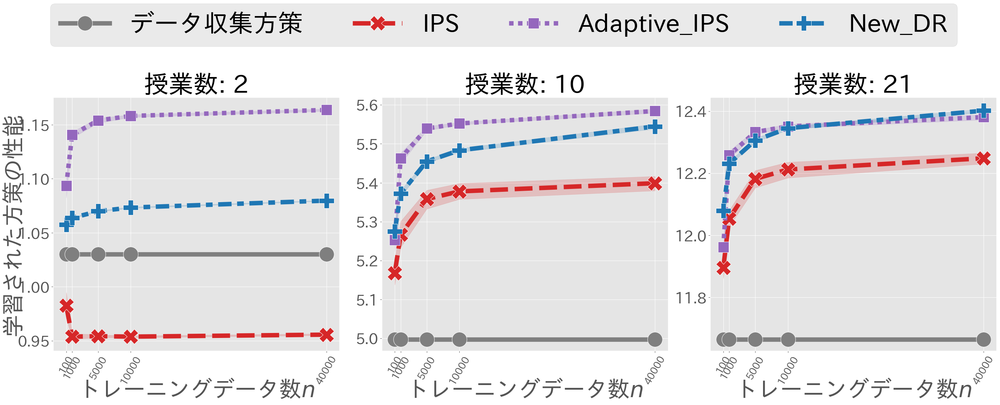

In [16]:
fig, ax_list = plt.subplots(1, 3, figsize=(28, 9.5), tight_layout=True)
for i, (num_actions, result_df) in enumerate(zip(num_actions_list, result_df_data_list)):
    ax = ax_list[i]
    sns.lineplot(
        linewidth=9,
        markersize=30,
        markers=True,
        x="num_data",
        y="value",
        hue="method",
        style="method",
        ax=ax,
        palette=["tab:grey", "tab:red", "tab:purple", "tab:blue"],
        legend=False,
        data=result_df,
    )
    ax.set_title(f"授業数: {num_actions}", fontsize=50)
    # yaxis
    if i == 0:
        ax.set_ylabel("学習された方策の性能", fontsize=45)
    else:
        ax.set_ylabel("")
    ax.tick_params(axis="y", labelsize=30)
    ax.yaxis.set_label_coords(-0.1, 0.5)
    # xaxis
    ax.set_xlabel("トレーニングデータ数$n$", fontsize=45)
    ax.set_xticks(num_data_list)
    ax.set_xticklabels(num_data_list, fontsize=20,rotation=60)
    ax.xaxis.set_label_coords(0.5, -0.11)
fig.legend(["データ収集方策", "IPS", "Adaptive_IPS", "New_DR"], fontsize=50, bbox_to_anchor=(0.5, 1.13), ncol=5, loc="center")

## 図6.10

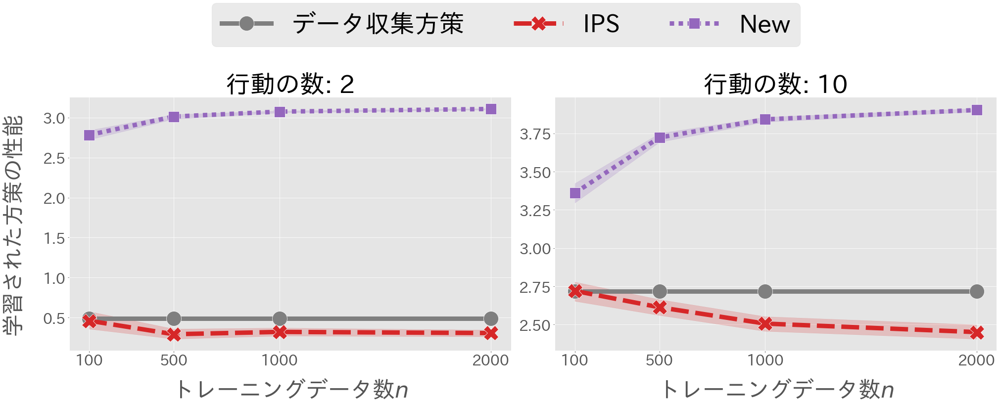

In [ ]:
fig, ax_list = plt.subplots(1, 2, figsize=(28, 9.5), tight_layout=True)
for i, (num_actions, result_df) in enumerate(zip(num_actions_list, result_df_data_list)):
    ax = ax_list[i]
    sns.lineplot(
        linewidth=9,
        markersize=30,
        markers=True,
        x="num_data",
        y="value",
        hue="method",
        style="method",
        ax=ax,
        palette=["tab:grey", "tab:red", "tab:purple"],
        legend=False,
        data=result_df,
    )
    ax.set_title(f"行動の数: {num_actions}", fontsize=50)
    # yaxis
    if i == 0:
        ax.set_ylabel("学習された方策の性能", fontsize=45)
    else:
        ax.set_ylabel("")
    ax.tick_params(axis="y", labelsize=30)
    ax.yaxis.set_label_coords(-0.1, 0.5)
    # xaxis
    ax.set_xlabel("トレーニングデータ数$n$", fontsize=45)
    ax.set_xticks(num_data_list)
    ax.set_xticklabels(num_data_list, fontsize=30)
    ax.xaxis.set_label_coords(0.5, -0.11)
fig.legend(["データ収集方策", "IPS", "New"], fontsize=50, bbox_to_anchor=(0.5, 1.13), ncol=5, loc="center")


### ログデータ(トレーニングデータ)のサイズ$n$を変化させたときの学習曲線の変化

In [ ]:
## シミュレーション設定
num_runs = 50 # シミュレーションの繰り返し回数
dim_x = 5 # 特徴量xの次元
num_actions = 10 # 行動数, |A|
beta = -0.1 # データ収集方策のパラメータ
max_iter = 21 # エポック数
test_data_size = 50000 # テストデータのサイズ
random_state = 12345
torch.manual_seed(random_state)
random_ = check_random_state(random_state)
num_data_list = [100, 500, 2000] # トレーニングデータのサイズ

In [ ]:
## 期待報酬関数を定義するためのパラメータを抽出
theta_1 = random_.normal(size=(dim_x, num_actions))
M_1 = random_.normal(size=(dim_x, num_actions))
b_1 = random_.normal(size=(1, num_actions))
theta_0 = random_.normal(size=(dim_x, num_actions))
M_0 = random_.normal(size=(dim_x, num_actions))
b_0 = random_.normal(size=(1, num_actions))
## 学習された方策の真の性能を近似するためのテストデータを生成
test_data = generate_synthetic_data2(
    num_data=test_data_size, beta=beta,
    theta_1=theta_1, M_1=M_1, b_1=b_1, theta_0=theta_0, M_0=M_0, b_0=b_0,
    dim_context=dim_x, num_actions=num_actions, random_state = random_state
)
pi_0, q_x_a_1, q_x_a_0 = test_data["pi_0"], test_data["q_x_a_1"], test_data["q_x_a_0"]
pi_0_naive_value = (pi_0 * q_x_a_1).sum(1).mean()
pi_0_cate_value = (pi_0 * q_x_a_1 + (1. - pi_0) * q_x_a_0).sum(1).mean()

curve_list_data = []
for num_data in num_data_list:
    curve = DataFrame()
    for _ in tqdm(range(num_runs), desc=f"num_data={num_data}..."):
        ## データ収集方策が形成する分布に従いログデータを生成
        offline_logged_data = generate_synthetic_data2(
            num_data=num_data, beta=beta,
            theta_1=theta_1, M_1=M_1, b_1=b_1, theta_0=theta_0, M_0=M_0, b_0=b_0,
            dim_context=dim_x, num_actions=num_actions, random_state = _
        )

        log_ = DataFrame([
            [pi_0_naive_value] * max_iter, [pi_0_cate_value] * max_iter, ["logging"] * max_iter],
            index=["naive_value", "cate_value", "method"]
        ).T.reset_index()

        ## ログデータを用いてオフ方策学習を実行する
        ### 勾配ベースのアプローチ (IPS推定量で方策勾配を推定)
        ips = IPSBasedGradientPolicyLearner(
            dim_x=dim_x, num_actions=num_actions, max_iter=max_iter, random_state=random_state + _
        )
        ips.fit(offline_logged_data, test_data)
        ips_ = DataFrame(
            [ips.naive_value, ips.cate_value, ["ips"] * max_iter],
            index=["naive_value", "cate_value", "method"]
        ).T.reset_index()
        ### 勾配ベースのアプローチ (新たに開発した推定量で方策勾配を推定)
        cate = CateBasedGradientPolicyLearner(
            dim_x=dim_x, num_actions=num_actions, max_iter=max_iter, random_state=random_state + _
        )
        cate.fit(offline_logged_data, test_data)
        cate_ = DataFrame(
            [cate.naive_value, cate.cate_value, ["cate"] * max_iter],
            index=["naive_value", "cate_value", "method"]
        ).T.reset_index()

        curve = pd.concat([curve, pd.concat([log_, ips_, cate_])])
    curve.reset_index(inplace=True)
    curve_list_data.append(curve)

num_data=2000...: 100%|██████████| 50/50 [04:21<00:00,  5.23s/it]


## 図6.11

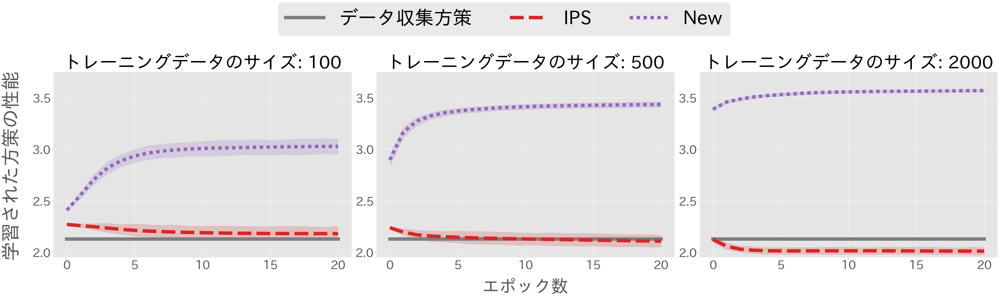

In [ ]:
fig, ax_list = plt.subplots(1, 3, figsize=(40, 10), tight_layout=True)
for i, (num_data, curve) in enumerate(zip(num_data_list, curve_list_data)):
    ax = ax_list[i]
    sns.lineplot(
        linewidth=10,
        x="index",
        y="cate_value",
        hue="method",
        style="method",
        ax=ax,
        palette=["tab:grey", "tab:red", "tab:purple"],
        legend=False,
        data=curve.query("method != 'pocem'"),
    )
    ax.set_title(f"トレーニングデータのサイズ: {num_data}", fontsize=52)
    # yaxis
    if i == 0:
        ax.set_ylabel("学習された方策の性能", fontsize=55)
    else:
        ax.set_ylabel("", fontsize=45)
    ax.set_ylim(1.95, 3.75)
    ax.tick_params(axis="y", labelsize=35)
    ax.yaxis.set_label_coords(-0.11, 0.5)
    # xaxis
    if i == 1:
        ax.set_xlabel("エポック数", fontsize=50)
    else:
        ax.set_xlabel("", fontsize=50)
    ax.tick_params(axis="x", labelsize=35)
    ax.xaxis.set_label_coords(0.5, -0.12)
fig.legend(
    ["データ収集方策", "IPS", "New"], fontsize=55,
    bbox_to_anchor=(0.5, 1.13), ncol=5, loc="center",
)


## 図6.12

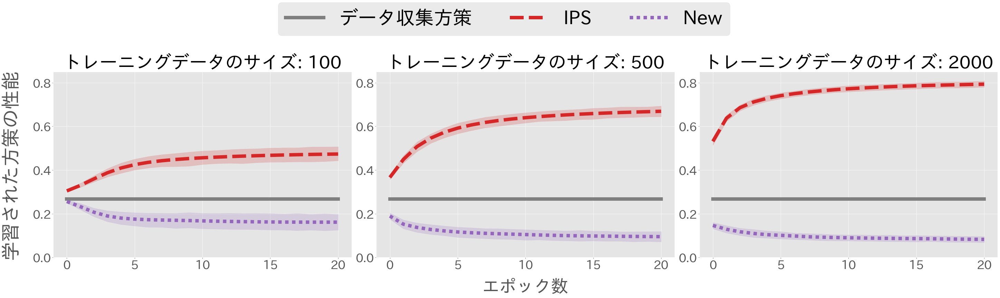

In [ ]:
fig, ax_list = plt.subplots(1, 3, figsize=(40, 10), tight_layout=True)
for i, (num_data, curve) in enumerate(zip(num_data_list, curve_list_data)):
    ax = ax_list[i]
    sns.lineplot(
        linewidth=10,
        x="index",
        y="naive_value",
        hue="method",
        style="method",
        ax=ax,
        palette=["tab:grey", "tab:red", "tab:purple"],
        legend=False,
        data=curve.query("method != 'pocem'"),
    )
    ax.set_title(f"トレーニングデータのサイズ: {num_data}", fontsize=52)
    # yaxis
    if i == 0:
        ax.set_ylabel("学習された方策の性能", fontsize=55)
    else:
        ax.set_ylabel("", fontsize=45)
    ax.set_ylim(0.0, 0.85)
    ax.tick_params(axis="y", labelsize=35)
    ax.yaxis.set_label_coords(-0.11, 0.5)
    # xaxis
    if i == 1:
        ax.set_xlabel("エポック数", fontsize=50)
    else:
        ax.set_xlabel("", fontsize=50)
    ax.tick_params(axis="x", labelsize=35)
    ax.xaxis.set_label_coords(0.5, -0.12)
fig.legend(
    ["データ収集方策", "IPS", "New"], fontsize=55,
    bbox_to_anchor=(0.5, 1.13), ncol=5, loc="center",
)


In [ ]:
keisan = keisan(1.1,3.5)

NameError: name 'keisan' is not defined